***
# Translation - Box
***

# Import from Github

In [1]:
# !git clone https://github.com/ihsaan-ullah/fair-universe
# %cd fair-universe/starting_kit

# Imports

In [2]:
import os
import numpy as np
import pandas as pd
from sys import path
from copy import copy, deepcopy
import warnings
warnings.filterwarnings("ignore")

## Directories

In [3]:
model_dir = 'sample_code_submission/'
result_dir = 'sample_result_submission/' 
problem_dir = 'ingestion_program/'  
score_dir = 'scoring_program/'

### Add directories to path

In [4]:
path.append(model_dir) 
path.append(problem_dir)
path.append(score_dir)
path.append("../Data_Generator")

***
# 0 - Generate Data
***

**Imports**

In [5]:
from data_loader import get_settings_from_json
from data_generator_new import DataGenerator

In [6]:
data_gen_settings = get_settings_from_json('data_jsons/box')
for index, settings in enumerate(data_gen_settings):
    data_gen = DataGenerator(settings_dict=settings)
    data_gen.load_settings()
    data_gen.generate_data()
    data_gen.save_data(directory="sample_data", file_index=index+1)
    

***
# 1 - Import Data
***

In [7]:
from data_io import load_data, show_data_statistics, write

In [8]:
data_name = 'fair_universe_challenge'
data_dir = 'sample_data' 

In [9]:
train_sets, test_sets, settings = load_data(data_dir, load_settings=True)



###-------------------------------------###
### Data Loading
###-------------------------------------###

[*] data dir :  sample_data
[*] train data dir :  sample_data/train/data
[*] train labels dir :  sample_data/train/labels
[*] test data dir :  sample_data/test/data
[*] test labels dir :  sample_data/test/labels
[*] settings dir :  sample_data/settings
[+] train data dir found
[+] train labels dir found
[+] test data dir found
[+] test labels dir found
[+] settings dir found
[+] 6 train and test sets found
---------------------------------
[+] Train and Test data loaded!
---------------------------------




### Data Statistics

In [10]:
show_data_statistics(train_sets, name="Train")

###-------------------------------------###
### Data Statistics Train
###-------------------------------------###
-------------------
Set 1
-------------------
[*] Total points:  1716
[*] Background points:  1517
[*] Signal points:  199
-------------------
Set 2
-------------------
[*] Total points:  1811
[*] Background points:  1612
[*] Signal points:  199
-------------------
Set 3
-------------------
[*] Total points:  1696
[*] Background points:  1497
[*] Signal points:  199
-------------------
Set 4
-------------------
[*] Total points:  1821
[*] Background points:  1622
[*] Signal points:  199
-------------------
Set 5
-------------------
[*] Total points:  1816
[*] Background points:  1617
[*] Signal points:  199
-------------------
Set 6
-------------------
[*] Total points:  1796
[*] Background points:  1597
[*] Signal points:  199


In [11]:
show_data_statistics(test_sets, name="Test")

###-------------------------------------###
### Data Statistics Test
###-------------------------------------###
-------------------
Set 1
-------------------
[*] Total points:  1480
[*] Background points:  1281
[*] Signal points:  199
-------------------
Set 2
-------------------
[*] Total points:  1811
[*] Background points:  1612
[*] Signal points:  199
-------------------
Set 3
-------------------
[*] Total points:  1990
[*] Background points:  1791
[*] Signal points:  199
-------------------
Set 4
-------------------
[*] Total points:  1224
[*] Background points:  1025
[*] Signal points:  199
-------------------
Set 5
-------------------
[*] Total points:  1894
[*] Background points:  1695
[*] Signal points:  199
-------------------
Set 6
-------------------
[*] Total points:  1987
[*] Background points:  1788
[*] Signal points:  199


**Data Visualization**

In [12]:
from visualize import (
    visualize_decicion_boundary,
    visualize_augmented_data,
    visualize_data,
    visualize_clocks,
    visualize_score,
    visualize_roc_curves
)

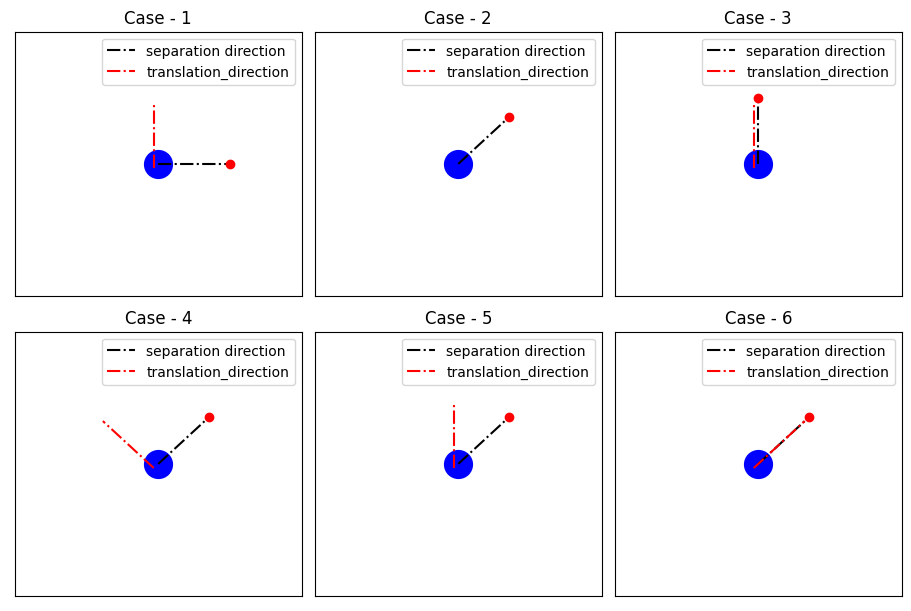

In [13]:
visualize_clocks(settings)

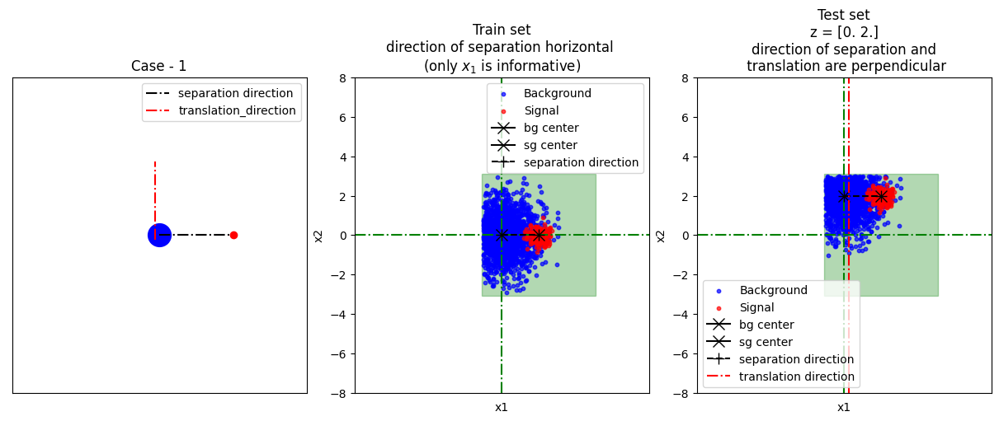

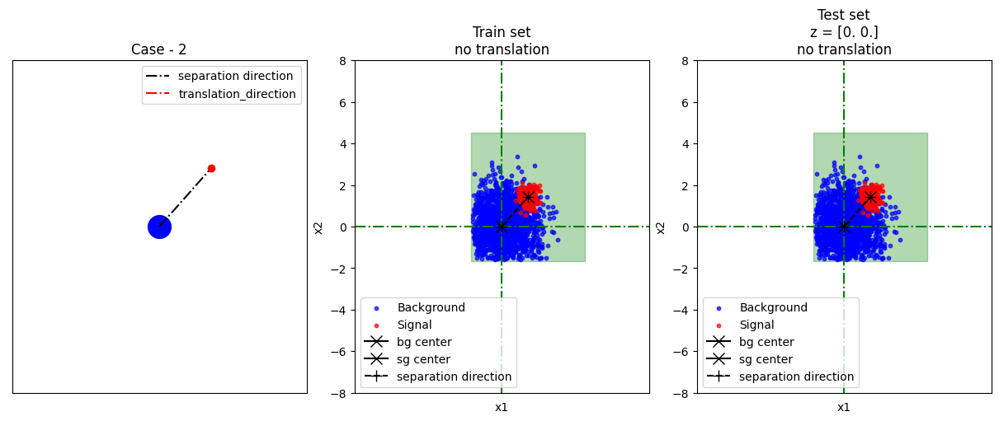

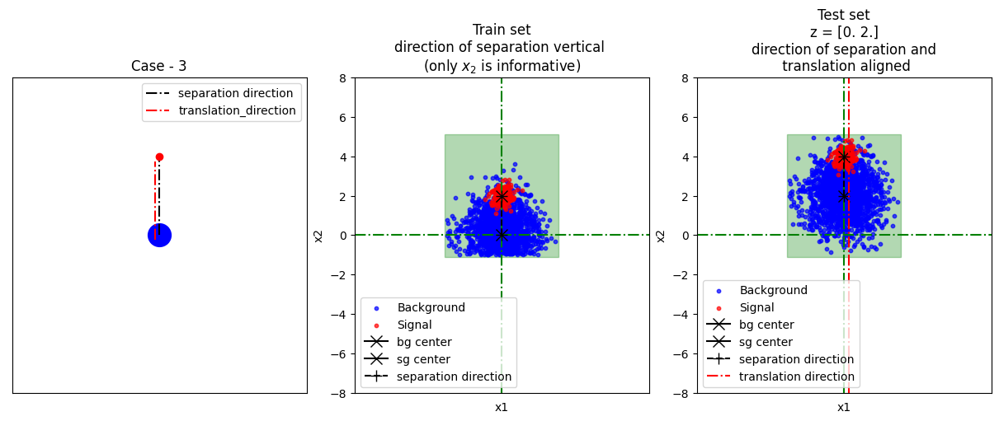

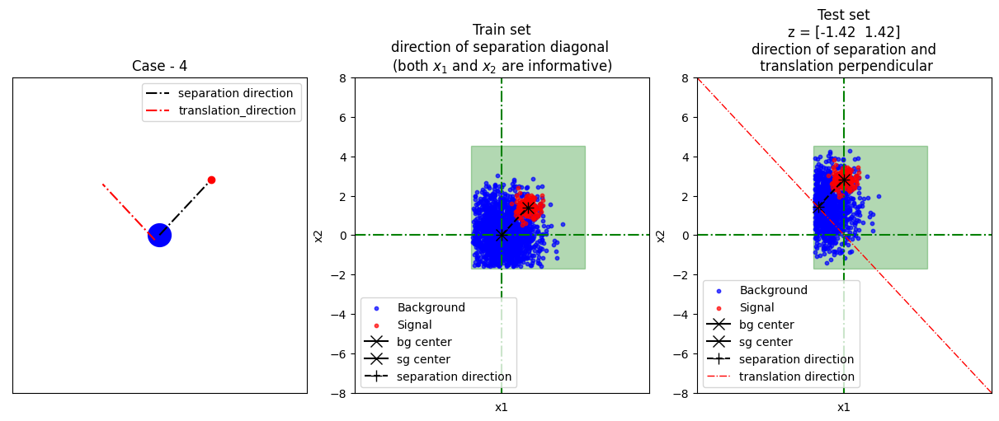

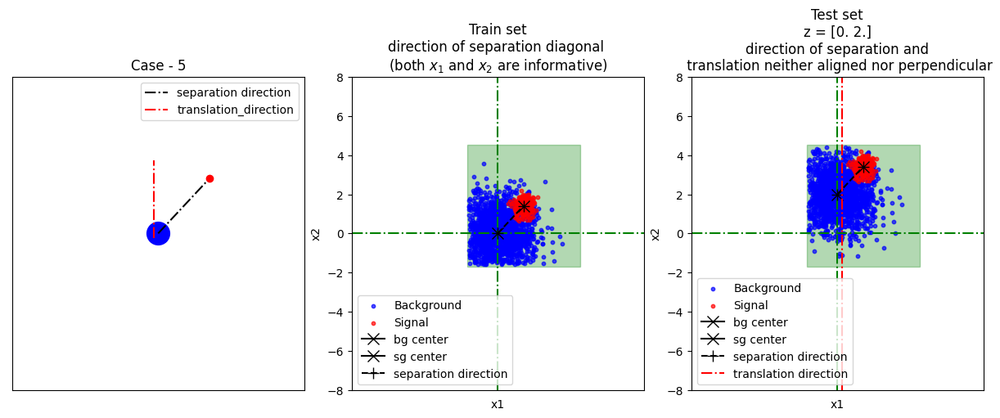

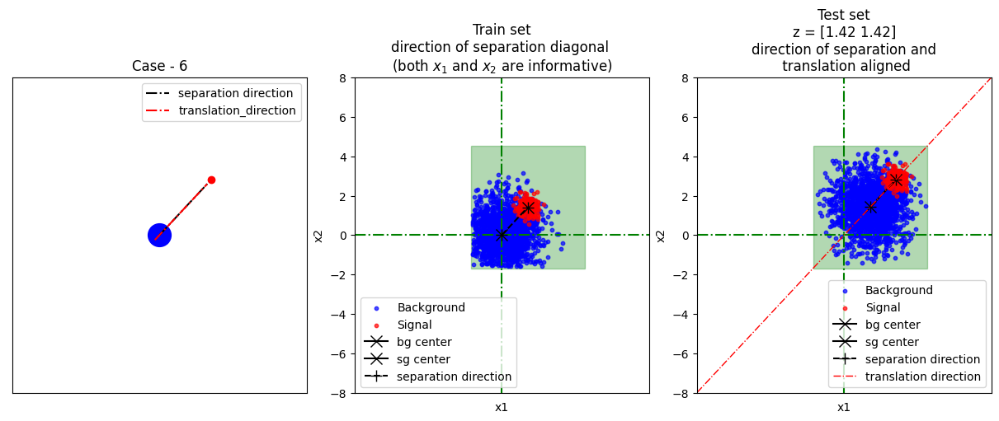

In [14]:
for index, _ in enumerate(train_sets):
    visualize_data(settings[index], train_sets[index], test_sets[index])

***
# 2 - Data Augmentation
***

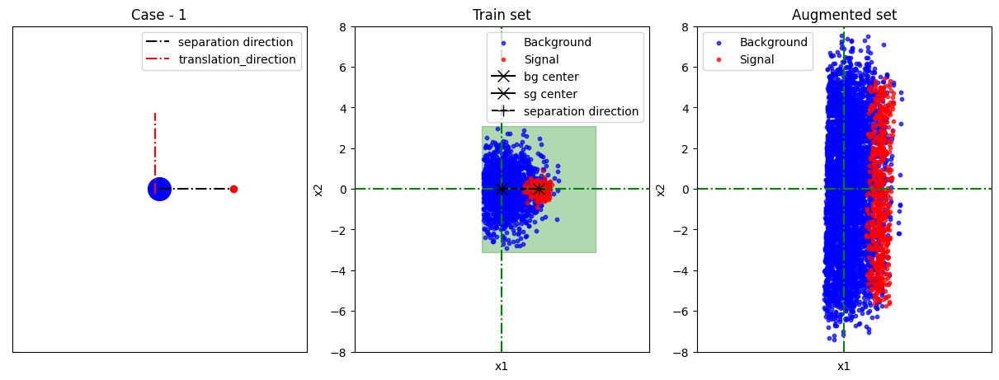

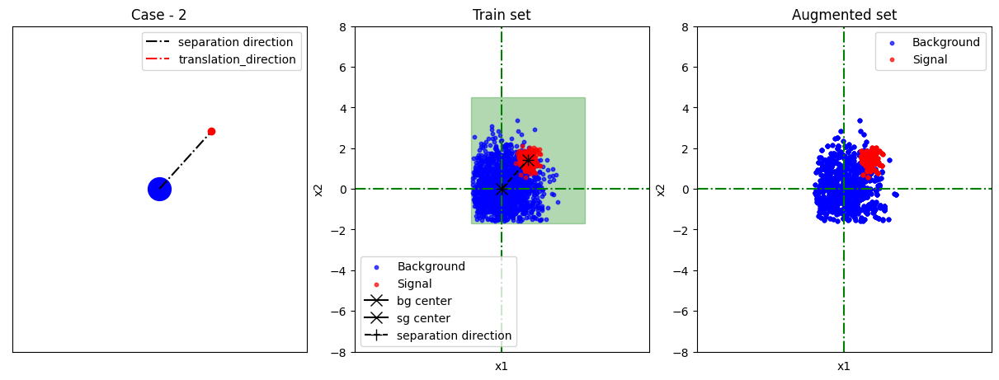

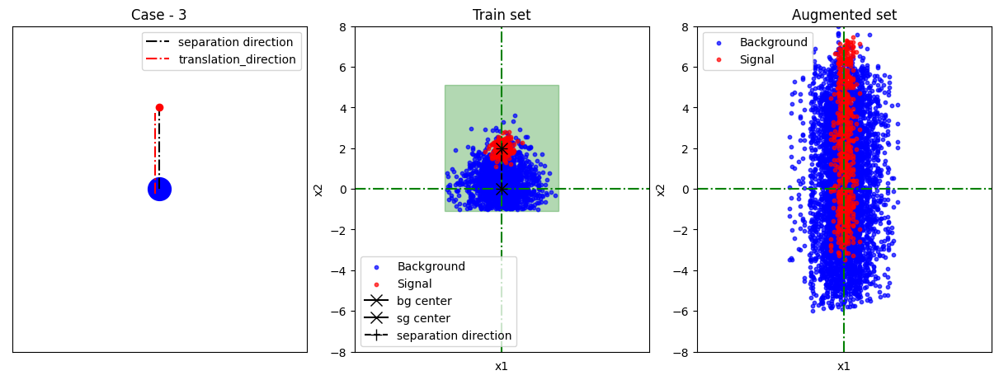

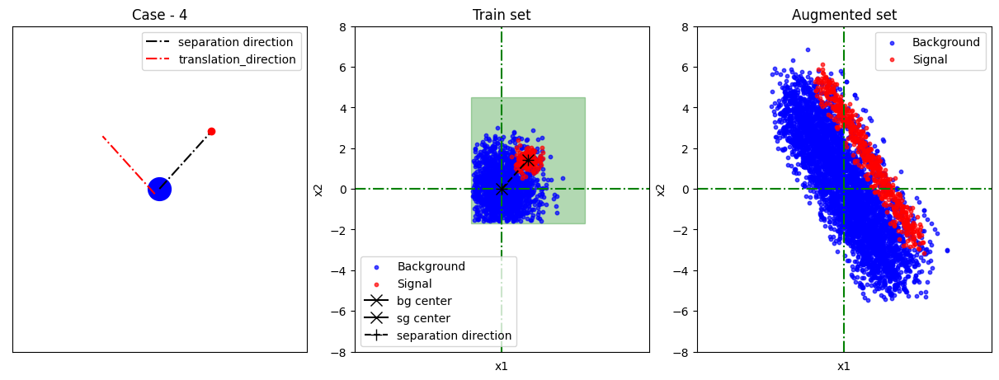

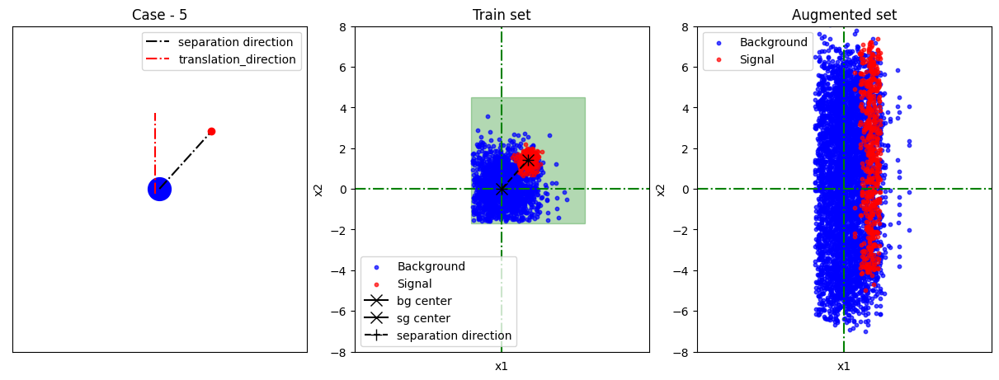

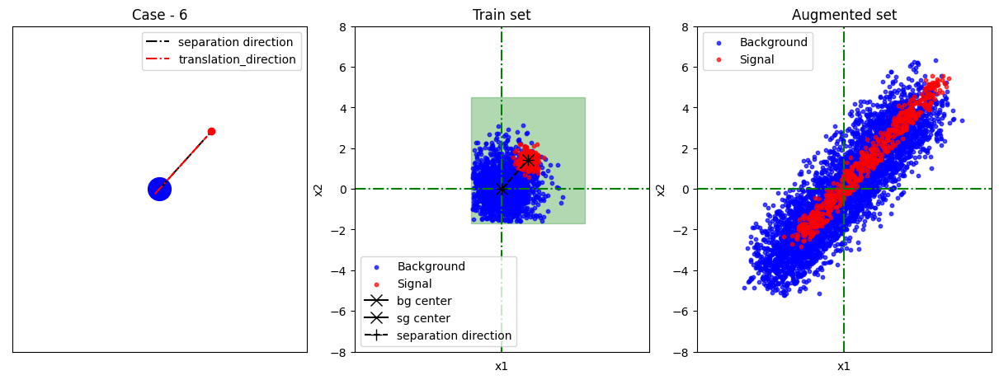

In [15]:
from augment_data import get_augmented_data

augmented_sets = []
for i, _ in enumerate(train_sets):
    augmented_set = get_augmented_data(train_sets[i],  test_sets[i])
    visualize_augmented_data(settings[i], train_sets[i], augmented_set)
    augmented_sets.append(augmented_set)

***
# 3 - Preprocessing
***

In [16]:
train_sets_preprocessed, test_sets_preprocessed = [], []
for train_set, test_set in zip(train_sets, test_sets):
    
    train_mean = np.mean(train_set["data"]).values
    test_mean = np.mean(test_set["data"]).values

    translation = test_mean - train_mean

    train_sets_preprocessed.append({
        "data" : train_set["data"] - translation, 
        "labels" : train_set["labels"] 
    })

    test_sets_preprocessed.append({
        "data" : test_set["data"] - translation, 
        "labels" : test_set["labels"] 
    })


***
# 4 - Baselines
***

In this section, we introduce the following baselines:

1. Constant model
2. NB plain
3. NB preprocessing
4. LDA plain
5. RR plain
6. NB data augmentation
7. LDA data augmentation
8. RR data augmentatio

**Import Model and Scoring function**

In [17]:
from model import Model
from metric import auc_metric, bac_metric

**Model Names and settings**

In [18]:
model_settings = [
    {"display_name" : "constant model", "model_name": "Constant", "preprocessing" : False, "preprocessing_method" : "translation",  "data_augmentation" : False, "data_augmentation_type":"translation"},
    {"display_name" : "NB plain", "model_name": "NB", "preprocessing" : False, "preprocessing_method" : "translation", "data_augmentation" : False, "data_augmentation_type":"translation"},
    {"display_name" : "NB preprocessing", "model_name": "NB", "preprocessing" : True, "preprocessing_method" : "translation", "data_augmentation" : False, "data_augmentation_type":"translation"},
    {"display_name" : "LDA plain", "model_name": "LDA", "preprocessing" : False, "preprocessing_method" : "translation", "data_augmentation" : False, "data_augmentation_type":"translation"},
    {"display_name" : "RR plain", "model_name": "RR", "preprocessing" : False, "preprocessing_method" : "translation", "data_augmentation" : False, "data_augmentation_type":"translation"},
    {"display_name" : "NB data augmentation", "model_name": "NB", "preprocessing" : False, "preprocessing_method" : "translation", "data_augmentation" : True, "data_augmentation_type":"translation"},
    {"display_name" : "LDA data augmentation", "model_name": "LDA", "preprocessing" : False, "preprocessing_method" : "translation", "data_augmentation" : True, "data_augmentation_type":"translation"},
    {"display_name" : "RR data augmentation", "model_name": "RR", "preprocessing" : False, "preprocessing_method" : "translation", "data_augmentation" : True, "data_augmentation_type":"translation"}
]

**Train and Test**  

- Load Data
- Train Model
- Get Predictions
- Get Score
- Get Metric Scores
- Save Predictions
- Save Scores


In [19]:
#---------------------------------
# Load Data
#---------------------------------
# Train set
X_Trains = [train_set["data"] for train_set in train_sets]
Y_Trains = [train_set["labels"] for train_set in train_sets]

# Test set
X_Tests = [test_set["data"] for test_set in test_sets]
Y_Tests = [test_set["labels"] for test_set in test_sets]


print("############################################")
print("### Training Program")
print("############################################")

#---------------------------------
# Loop over model settings
#---------------------------------
results = []
for model_setting in model_settings:

    print("\n--------------------------------------------")
    print("[*] Model : {} --- Preprocessing: {} --- Data Augmentation: {}".format(model_setting["model_name"], model_setting["preprocessing"], model_setting["data_augmentation"]))
    print("--------------------------------------------")
    #---------------------------------
    # Predictions Directory
    #---------------------------------
    # result directory 
    predictions_dir = os.path.join(result_dir, model_setting["model_name"])
    # create result directory if not created
    if not os.path.exists(predictions_dir):
        os.mkdir(predictions_dir) 

    #---------------------------------
    # Loop over datasets
    #---------------------------------
    trained_models = []
    Y_hat_trains, Y_hat_score_trains = [], []
    Y_hat_tests, Y_hat_score_tests = [], []
    auc_trains, auc_tests, bac_trains, bac_tests = [],[],[],[]
    for index, _ in enumerate(X_Trains):

        print("\n\tDataset : {}".format(index+1))
        print("\t----------------")

    
        # model_name 
        trained_model_name = model_dir + model_setting["model_name"]

        #---------------------------------
        # Load Model
        #---------------------------------
        print("\t[*] Loading Model")
        model = Model(
            model_setting["model_name"],
            X_Trains[index],
            Y_Trains[index],
            X_Tests[index],
            model_setting["preprocessing"],
            model_setting["preprocessing_method"],
            model_setting["data_augmentation"],
            model_setting["data_augmentation_type"]
        )
        # Load Trained Model 
        # model = model.load(trained_model_name) 

        #---------------------------------
        # Train Model
        #---------------------------------
        # Train model if not trained
        print("\t[*] Training Model")
        if not(model.is_trained):
            model.fit() 

        #---------------------------------
        # Get Predictions
        #---------------------------------
        print("\t[*] Get Predictions")
        Y_hat_trains.append(model.predict(X_Trains[index]))
        Y_hat_tests.append(model.predict())
            
        #---------------------------------
        # Get Scores/Proba
        #---------------------------------
        print("\t[*] Get Scores")
        Y_hat_score_trains.append(model.decision_function(X_Trains[index]))
        Y_hat_score_tests.append(model.decision_function())

        trained_models.append(model)

        #---------------------------------
        # Get Metric Scores
        #---------------------------------
        print("\t[*] Computing Scores using AUC and BAC")
        auc_trains.append(round(auc_metric(Y_Trains[index], Y_hat_score_trains[-1]), 2))
        auc_tests.append(round(auc_metric(Y_Tests[index], Y_hat_score_tests[-1]), 2))
        bac_trains.append(round(bac_metric(Y_Trains[index], Y_hat_trains[-1]), 2))
        bac_tests.append(round(bac_metric(Y_Tests[index], Y_hat_tests[-1]), 2))


        #---------------------------------
        # Save Predictions
        #---------------------------------
        print("\t[*] Saving Predictions and Scores")
        # prediction file name
        prediction_name_train = os.path.join(predictions_dir, "train_"+ str(index+1) + ".predictions")
        prediction_name_test = os.path.join(predictions_dir, "test_"+ str(index+1) + ".predictions")

        # score file name
        score_name_train = os.path.join(predictions_dir, "train_"+ str(index+1) + ".scores")
        score_name_test = os.path.join(predictions_dir, "test_"+ str(index+1) + ".scores")
        
        # save prediction
        write(prediction_name_train, Y_hat_score_trains[-1])
        write(prediction_name_test, Y_hat_score_tests[-1])

        # save score
        write(score_name_train, Y_hat_score_trains[-1])
        write(score_name_test, Y_hat_score_tests[-1])
    

    #---------------------------------
    # Average Scores
    #---------------------------------

    train_auc_mean = round(np.mean(auc_trains), 2)
    test_auc_mean = round(np.mean(auc_tests), 2)
    train_bac_mean = round(np.mean(bac_trains), 2)
    test_bac_mean = round(np.mean(bac_tests), 2)


    #---------------------------------
    # Error Bars
    #---------------------------------
    # between-task-variance =  sigma^2/n
    # within-task-variance ~= A(1-A) / 2*N_signals, A = AUC or BAC

    ps = 1- settings[index]["p_b"]
    total_events = settings[index]["total_number_of_events"] 
    N_signals = ps*total_events*2
    
    train_auc_between_task_variance =  np.var(auc_trains)/len(auc_trains)
    train_auc_within_task_variance = (train_auc_mean*(1-train_auc_mean))/N_signals

    test_auc_between_task_variance =  np.var(auc_tests)/len(auc_tests)
    test_auc_within_task_variance = (test_auc_mean*(1-test_auc_mean))/N_signals

    train_bac_between_task_variance =  np.var(bac_trains)/len(bac_trains)
    train_bac_within_task_variance = (train_bac_mean*(1-train_bac_mean))/N_signals

    test_bac_between_task_variance =  np.var(bac_tests)/len(bac_tests)
    test_bac_within_task_variance = (test_bac_mean*(1-test_bac_mean))/N_signals
    

    train_auc_err = round(np.sqrt(train_auc_between_task_variance + train_auc_within_task_variance), 2)
    test_auc_err = round(np.sqrt(test_auc_between_task_variance + test_auc_within_task_variance), 2)
    train_bac_err = round(np.sqrt(train_bac_between_task_variance + train_bac_within_task_variance), 2)
    test_bac_err = round(np.sqrt(test_bac_between_task_variance + test_bac_within_task_variance), 2)



    

    results.append({
        "trained_models" : trained_models,
        "Y_hat_trains" : Y_hat_trains,
        "Y_hat_tests" : Y_hat_tests,
        "Y_hat_score_trains" : Y_hat_score_trains,
        "Y_hat_score_tests" : Y_hat_score_tests,
        "auc_trains" : auc_trains,
        "auc_tests" : auc_tests,
        "bac_trains" : bac_trains,
        "bac_tests" : bac_tests,
        "train_auc_err" : train_auc_err,
        "test_auc_err" : test_auc_err,
        "train_bac_err" : train_bac_err,
        "test_bac_err" : test_bac_err,
        "train_auc_mean" : train_auc_mean,
        "test_auc_mean" : test_auc_mean,
        "train_bac_mean" : train_bac_mean,
        "test_bac_mean" : test_bac_mean

    })

############################################
### Training Program
############################################

--------------------------------------------
[*] Model : Constant --- Preprocessing: False --- Data Augmentation: False
--------------------------------------------

	Dataset : 1
	----------------
	[*] Loading Model
	[*] Training Model
	[*] Get Predictions
	[*] Get Scores
	[*] Computing Scores using AUC and BAC
	[*] Saving Predictions and Scores

	Dataset : 2
	----------------
	[*] Loading Model
	[*] Training Model
	[*] Get Predictions
	[*] Get Scores
	[*] Computing Scores using AUC and BAC
	[*] Saving Predictions and Scores

	Dataset : 3
	----------------
	[*] Loading Model
	[*] Training Model
	[*] Get Predictions
	[*] Get Scores
	[*] Computing Scores using AUC and BAC
	[*] Saving Predictions and Scores

	Dataset : 4
	----------------
	[*] Loading Model
	[*] Training Model
	[*] Get Predictions
	[*] Get Scores
	[*] Computing Scores using AUC and BAC
	[*] Saving Predictions an

### **Optimal Bayesian Classifier**

In [20]:
from obc import get_OBC_predictions_score

obc_predictions, obc_scores = get_OBC_predictions_score(settings[1], X_Tests[1])

obc_auc = round(auc_metric(Y_Trains[1], obc_scores), 2)
obc_bac = round(bac_metric(Y_Tests[1], obc_predictions), 2)

***
# 5 - Decision Boundaries
***

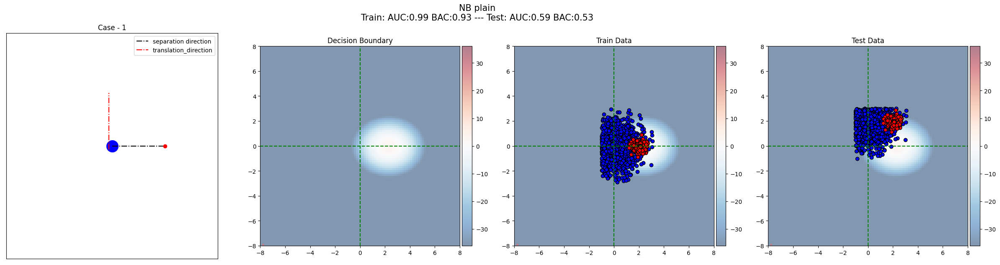

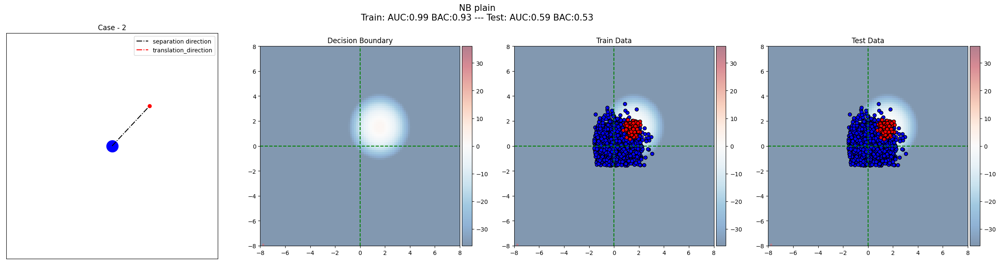

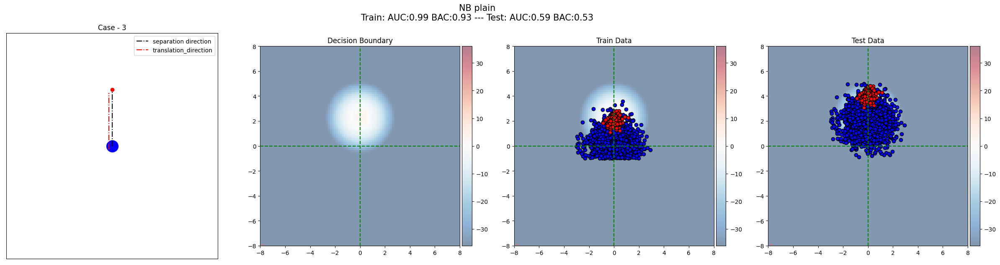

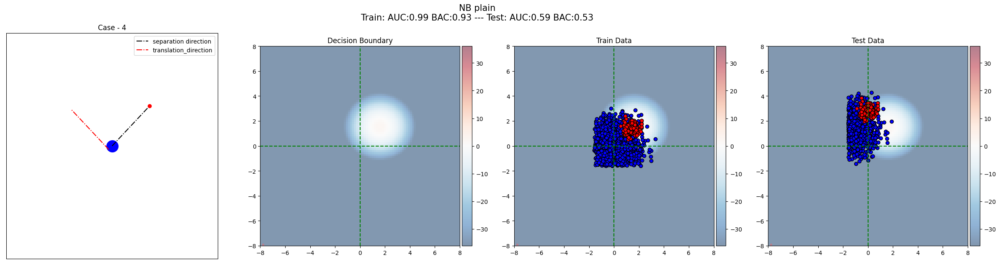

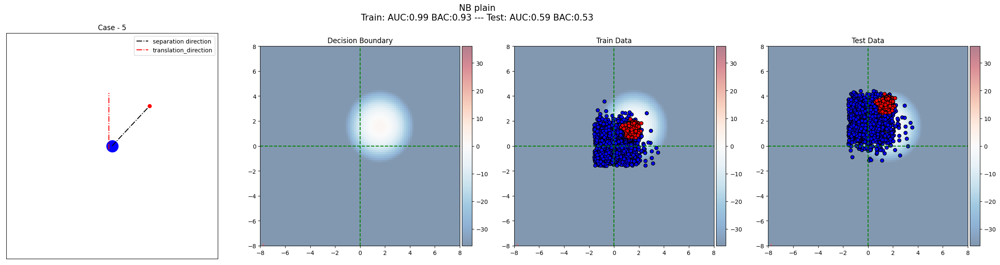

...

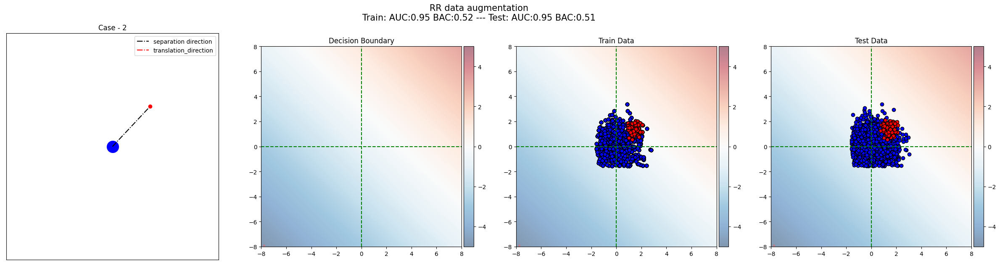

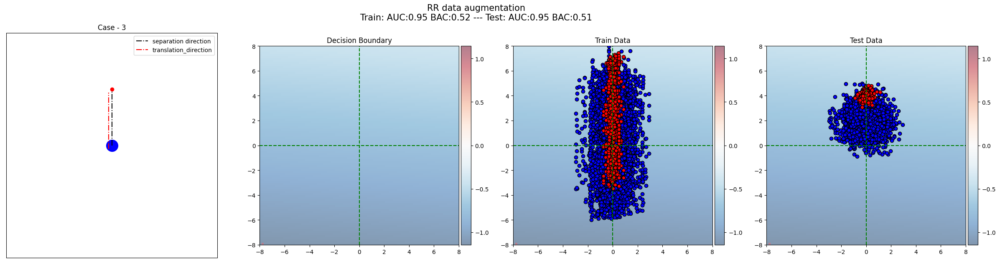

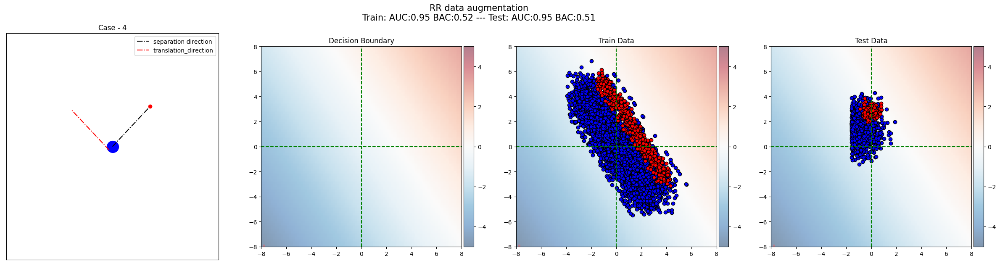

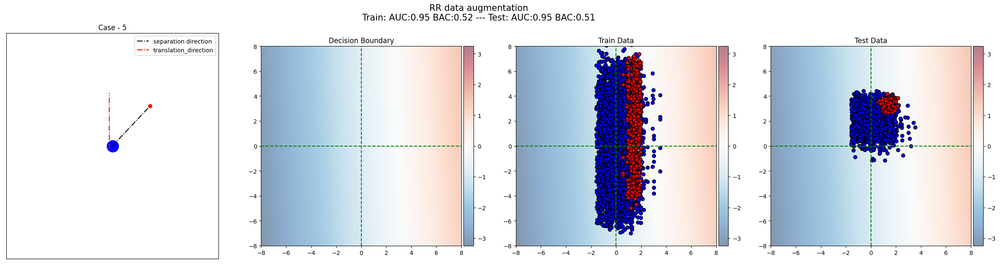

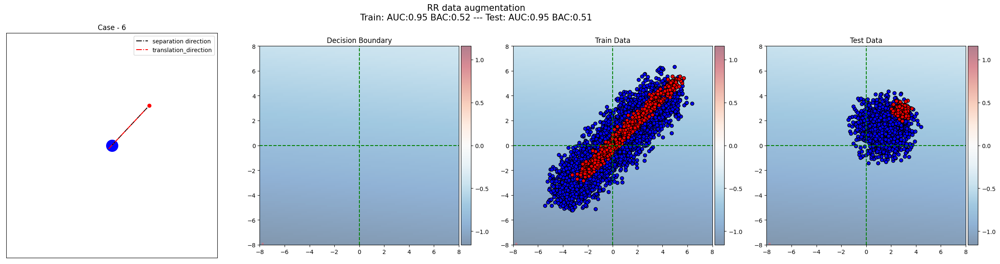

In [21]:
for model_s, result in zip(model_settings, results):
    if model_s["model_name"] != "Constant":
        if model_s["preprocessing"]:
            visualize_decicion_boundary(model_s["display_name"], settings, result, train_sets, test_sets_preprocessed)
        elif model_s["data_augmentation"]:
            visualize_decicion_boundary(model_s["display_name"], settings, result, augmented_sets, test_sets)
        else:
            visualize_decicion_boundary(model_s["display_name"], settings, result, train_sets, test_sets)

***
# 6 - ROC Curves
***

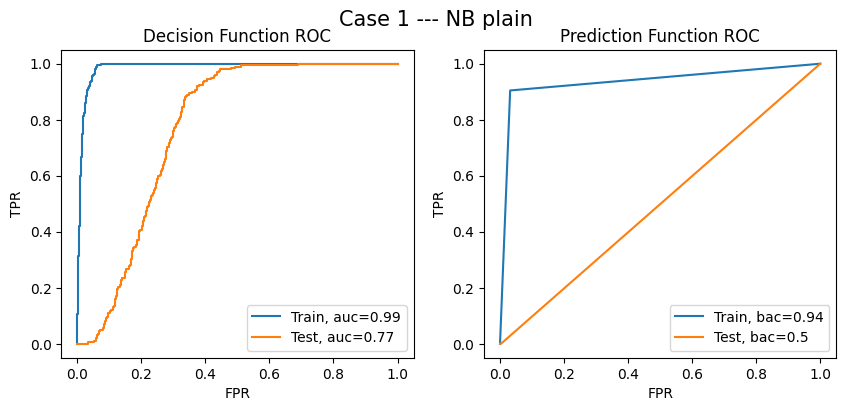

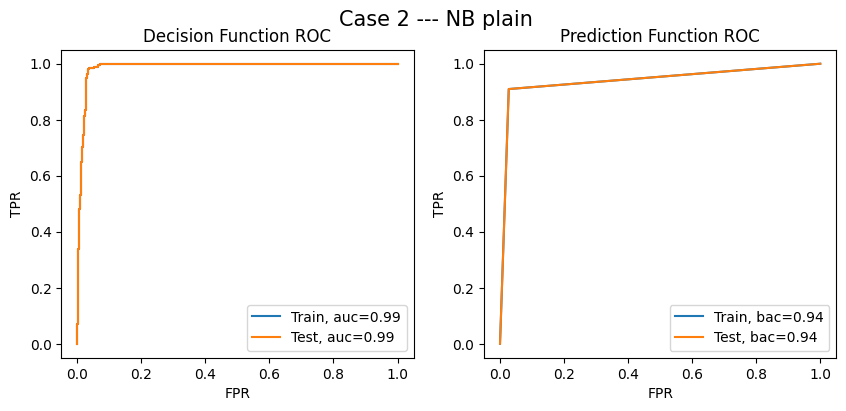

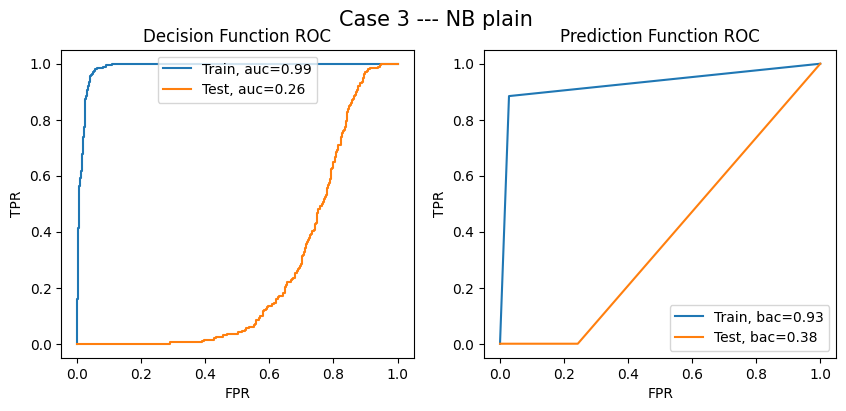

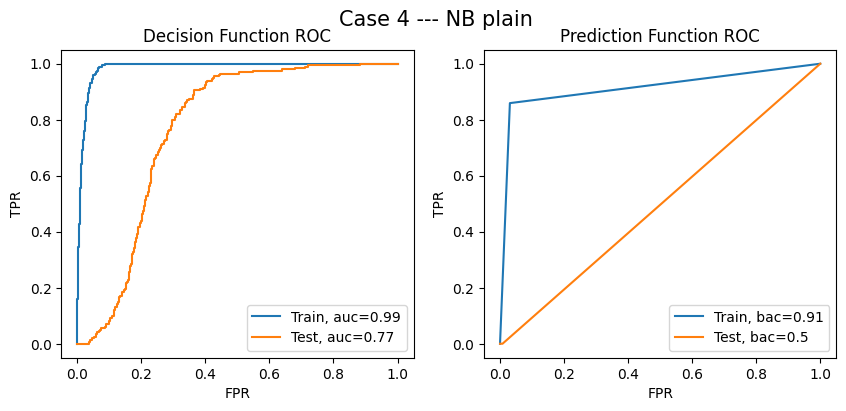

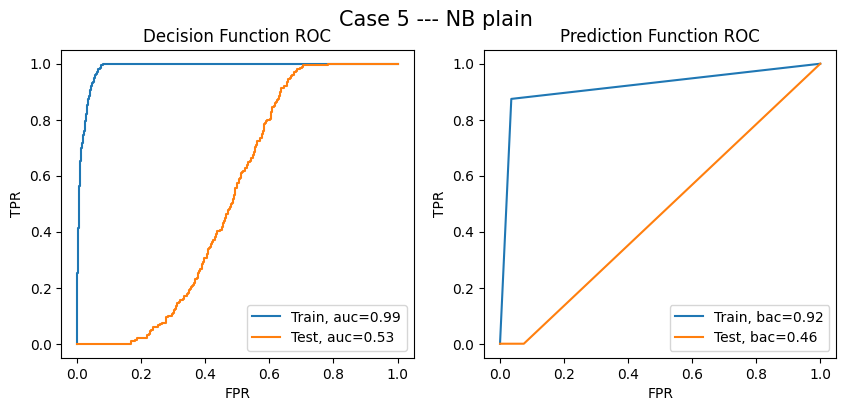

...

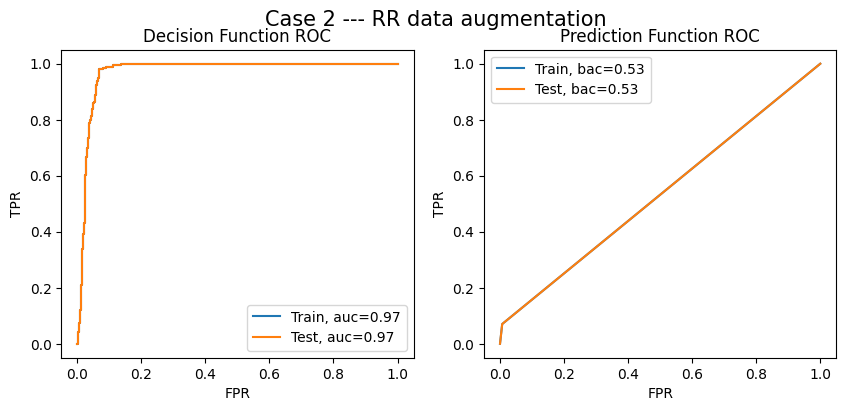

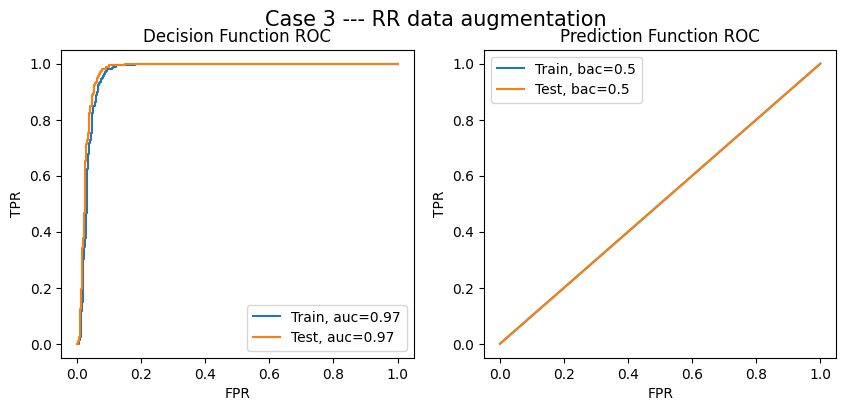

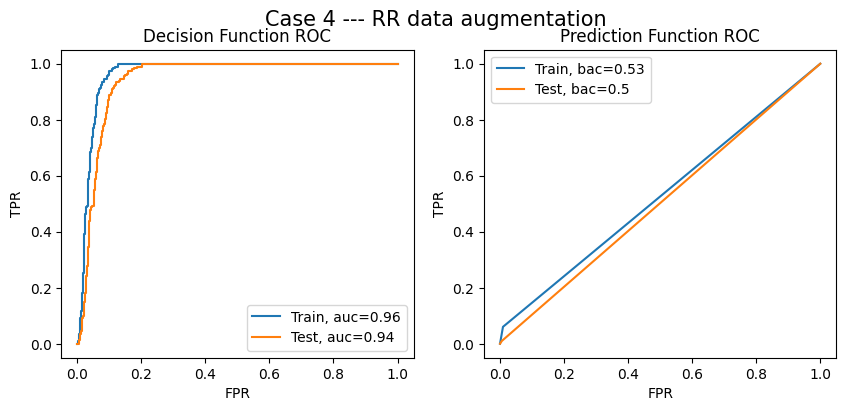

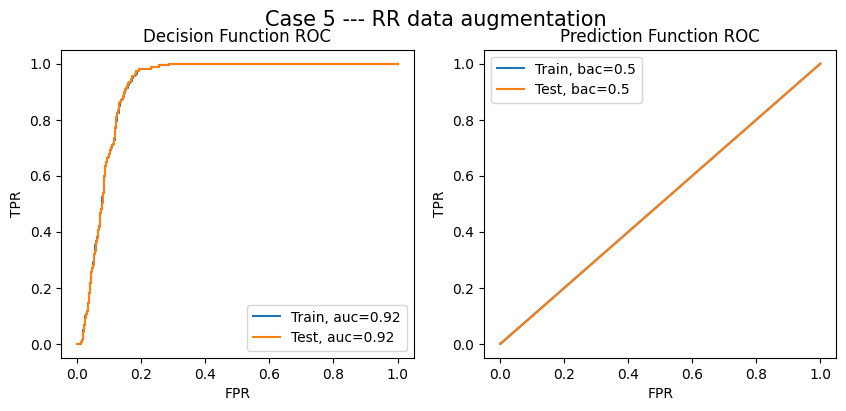

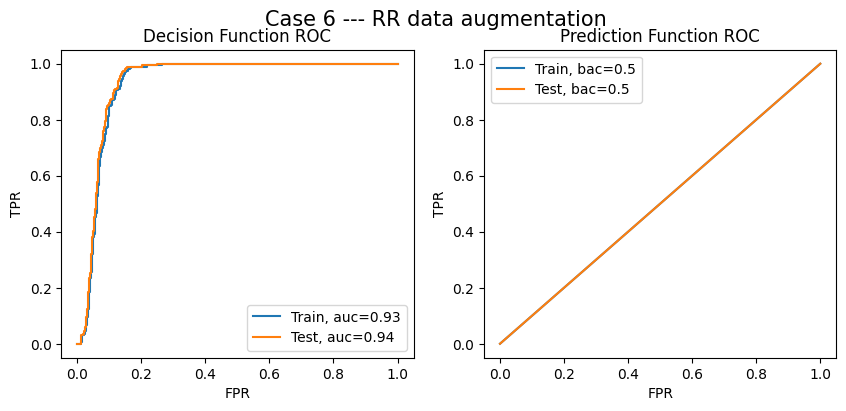

In [22]:
for model_s, result in zip(model_settings, results):
    if model_s["model_name"] != "Constant":
        visualize_roc_curves(model_s["display_name"], result, settings, Y_Trains, Y_Tests)

***
# 7 - Scoring
***

In [23]:
train_columns = ["train_set 1", "train_set 2", "train_set 3", "train_set 4", "train_set 5", "train_set 6", "avg", "std_err"]
test_columns = ["test_set 1", "test_set 2", "test_set 3", "test_set 4", "test_set 5", "test_set 6",  "avg", "std_err"]


train_aucs, test_aucs, train_bacs, test_bacs, indexes = [],[],[],[],[]
for model_s, result in zip(model_settings, results):
    indexes.append(model_s["display_name"])

    

    train_aucs.append(copy(result["auc_trains"]))
    train_aucs[-1].extend([result["train_auc_mean"], result["train_auc_err"]])
    test_aucs.append(copy(result["auc_tests"]))
    test_aucs[-1].extend([result["test_auc_mean"], result["test_auc_err"]])
    train_bacs.append(copy(result["bac_trains"]))
    train_bacs[-1].extend([result["train_bac_mean"], result["train_bac_err"]])
    test_bacs.append(copy(result["bac_tests"]))
    test_bacs[-1].extend([result["test_bac_mean"], result["test_bac_err"]])



score_auc_df_train = pd.DataFrame(data=train_aucs, columns=train_columns, index=indexes)
score_auc_df_test = pd.DataFrame(data=test_aucs, columns=test_columns, index=indexes)
score_bac_df_train = pd.DataFrame(data=train_bacs, columns=train_columns, index=indexes)
score_bac_df_test = pd.DataFrame(data=test_bacs, columns=test_columns, index=indexes)


score_auc_df_train.to_csv("scoring_output/auc_train.csv")
score_auc_df_test.to_csv("scoring_output/auc_test.csv")
score_bac_df_train.to_csv("scoring_output/bac_train.csv")
score_bac_df_test.to_csv("scoring_output/bac_test.csv")


In [24]:
score_auc_df_train

,train_set 1,train_set 2,train_set 3,train_set 4,train_set 5,train_set 6,avg,std_err
constant model,0.50,0.50,0.50,0.50,0.50,0.50,0.50,0.03
NB plain,0.99,0.99,0.99,0.99,0.99,0.99,0.99,0.00
NB preprocessing,0.83,0.99,0.97,0.91,0.97,0.98,0.94,0.03
LDA plain,0.97,0.97,0.97,0.97,0.97,0.97,0.97,0.01
RR plain,0.97,0.97,0.97,0.97,0.97,0.97,0.97,0.01
NB data augmentation,0.97,0.99,0.90,0.96,0.94,0.97,0.96,0.02
LDA data augmentation,0.97,0.97,0.97,0.96,0.92,0.92,0.95,0.01
RR data augmentation,0.97,0.97,0.97,0.96,0.92,0.93,0.95,0.01


In [25]:
score_auc_df_test

,test_set 1,test_set 2,test_set 3,test_set 4,test_set 5,test_set 6,avg,std_err
constant model,0.50,0.50,0.50,0.50,0.50,0.50,0.50,0.03
NB plain,0.77,0.99,0.26,0.77,0.53,0.22,0.59,0.12
NB preprocessing,0.98,0.99,0.99,0.97,0.99,0.99,0.98,0.01
LDA plain,0.97,0.97,0.97,0.95,0.97,0.97,0.97,0.01
RR plain,0.97,0.97,0.97,0.95,0.97,0.97,0.97,0.01
NB data augmentation,0.97,0.99,0.90,0.93,0.94,0.98,0.95,0.02
LDA data augmentation,0.97,0.97,0.97,0.94,0.92,0.93,0.95,0.01
RR data augmentation,0.97,0.97,0.97,0.94,0.92,0.94,0.95,0.01


In [26]:
score_bac_df_train

,train_set 1,train_set 2,train_set 3,train_set 4,train_set 5,train_set 6,avg,std_err
constant model,0.50,0.50,0.50,0.50,0.50,0.50,0.50,0.03
NB plain,0.94,0.94,0.93,0.91,0.92,0.91,0.93,0.01
NB preprocessing,0.50,0.94,0.50,0.50,0.50,0.50,0.57,0.07
LDA plain,0.85,0.82,0.85,0.80,0.77,0.82,0.82,0.02
RR plain,0.56,0.52,0.54,0.51,0.50,0.50,0.52,0.03
NB data augmentation,0.91,0.95,0.50,0.50,0.73,0.50,0.68,0.08
LDA data augmentation,0.86,0.86,0.50,0.83,0.51,0.50,0.68,0.07
RR data augmentation,0.56,0.53,0.50,0.53,0.50,0.50,0.52,0.03


In [27]:
score_bac_df_test

,test_set 1,test_set 2,test_set 3,test_set 4,test_set 5,test_set 6,avg,std_err
constant model,0.50,0.50,0.50,0.50,0.50,0.50,0.50,0.03
NB plain,0.50,0.94,0.38,0.50,0.46,0.38,0.53,0.08
NB preprocessing,0.90,0.94,0.96,0.69,0.92,0.95,0.89,0.04
LDA plain,0.84,0.82,0.71,0.68,0.83,0.72,0.77,0.03
RR plain,0.55,0.52,0.83,0.50,0.94,0.86,0.70,0.08
NB data augmentation,0.91,0.95,0.50,0.50,0.77,0.50,0.69,0.08
LDA data augmentation,0.84,0.86,0.50,0.58,0.54,0.50,0.64,0.07
RR data augmentation,0.55,0.53,0.50,0.50,0.50,0.50,0.51,0.03


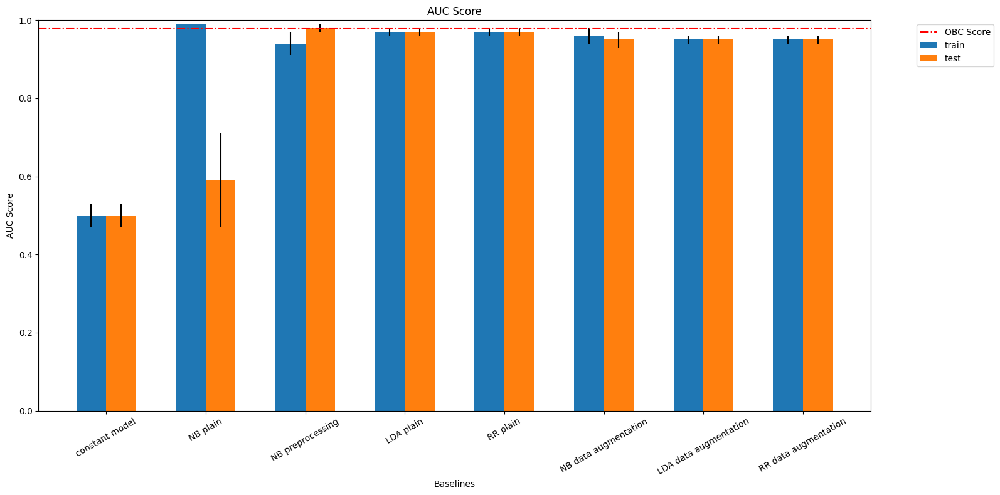

In [28]:
visualize_score(score_auc_df_train, score_auc_df_test, obc_auc, "AUC Score")

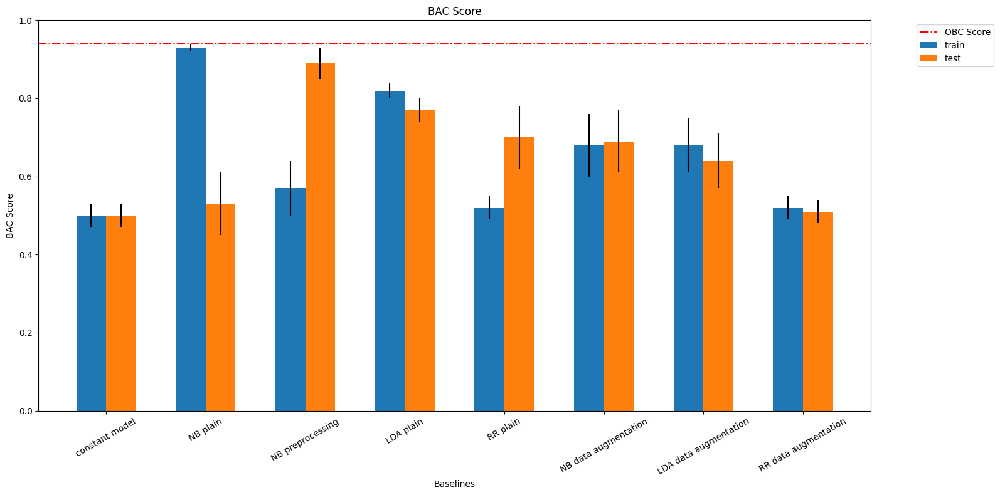

In [29]:
visualize_score(score_bac_df_train, score_bac_df_test, obc_bac, "BAC Score")

***
# 8 - Submissions
***

### Unit Testing 

It is <b><span style="color:red">important that you test your submission files before submitting them</span></b>. All you have to do to make a submission is modify the file <code>model.py</code> in the <code>sample_code_submission/</code> directory, then run this test to make sure everything works fine. This is the actual program that will be run on the server to test your submission. 
<br>
Keep the sample code simple.<br>

<code>python3</code> is required for this step

**Test Ingestion Program**

In [30]:
!python3 $problem_dir/ingestion.py

############################################
### Ingestion Program
############################################


###-------------------------------------###
### Data Loading
###-------------------------------------###

[*] data dir :  ./sample_data
[*] train data dir :  ./sample_data/train/data
[*] train labels dir :  ./sample_data/train/labels
[*] test data dir :  ./sample_data/test/data
[*] test labels dir :  ./sample_data/test/labels
[+] train data dir found
[+] train labels dir found
[+] test data dir found
[+] test labels dir found
[+] 6 train and test sets found
---------------------------------
[+] Train and Test data loaded!
---------------------------------



[*] Dataset : 1
-----------
[*] Loading Model
[*] Training Model
[*] Making Predictions
/Users/ihsanullah/Desktop/Fair-Universe-Github/starting_kit/./sample_code_submission/model.py:246: RuntimeWarning: invalid value encountered in log
  predicted_score = -np.log((1/(predicted_score+epsilon))-1)
[*] Saving Predictions
[

**Test Scoring Program**

In [31]:
!python3 $score_dir/score.py

############################################
### Scoring Program
############################################
[*] Reading predictions and solutions
[*] Predictions files : ['test_6.predictions', 'test_3.predictions', 'test_5.predictions', 'test_2.predictions', 'test_4.predictions', 'test_1.predictions']
[*] Score files : ['test_3.scores', 'test_1.scores', 'test_5.scores', 'test_2.scores', 'test_4.scores', 'test_6.scores']
[*] Solutions files : ['test_3.labels', 'test_1.labels', 'test_5.labels', 'test_2.labels', 'test_4.labels', 'test_6.labels']
[+] 6 prediction, score, solution files found
---------------------------------
[+] Predictions and Solution files loaded!
---------------------------------


[*] Computing AUC and BAC scores

Test set 1
-----------
AUC: 0.77
BAC: 0.5

Test set 2
-----------
AUC: 0.99
BAC: 0.94

Test set 3
-----------
AUC: 0.26
BAC: 0.38

Test set 4
-----------
AUC: 0.77
BAC: 0.5

Test set 5
-----------
AUC: 0.53
BAC: 0.46

Test set 6
-----------
AUC: 0.22
BAC: 

### Prepare the submission

In [32]:
import datetime 
from data_io import zipdir
the_date = datetime.datetime.now().strftime("%y-%m-%d-%H-%M")
code_submission = 'code_submission_' + the_date + '.zip'
# sample_result_submission = '../sample_result_submission_' + the_date + '.zip'
zipdir(code_submission, model_dir)
# zipdir(sample_result_submission, result_dir)
print("Submit : " + code_submission + " to the compeition: https://www.codabench.org/competitions/674/")

Submit : code_submission_23-03-29-15-19.zip to the compeition: https://www.codabench.org/competitions/674/


Sample Code Submission is generated in the directory: `fair-universe/starting_kit/`